In [ ]:
#import the libraries
import pandas as pd
import numpy as np

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

from numpy.random import seed
from numpy.random import randn
from numpy import mean
from numpy import std

from statsmodels.graphics.gofplots import qqplot
from scipy.stats import shapiro
from scipy.stats import normaltest
from scipy.stats import anderson


from statsmodels.formula.api import ols
import scipy.stats
from scipy import stats
import statsmodels.api as sm

import missingno as mano

import seaborn as sns

In [ ]:
# Read car_features.xls
df = pd.read_excel('/content/car_features.xlsx')


<h2>Data Set Description</h2>

In [ ]:
df.dtypes

Make                  object
Model                 object
Year                   int64
Engine Fuel Type      object
Engine HP            float64
Engine Cylinders     float64
Transmission Type     object
Driven_Wheels         object
Number of Doors      float64
Market Category       object
Vehicle Size          object
Vehicle Style         object
highway MPG            int64
city mpg               int64
Popularity             int64
MSRP                   int64
dtype: object

In [ ]:
df.describe()

,Year,Engine HP,Engine Cylinders,Number of Doors,highway MPG,city mpg,Popularity,MSRP
count,11914.000000,11845.00000,11884.000000,11908.000000,11914.000000,11914.000000,11914.000000,1.191400e+04
mean,2010.384338,249.38607,5.628829,3.436093,26.637485,19.733255,1554.911197,4.059474e+04
std,7.579740,109.19187,1.780559,0.881315,8.863001,8.987798,1441.855347,6.010910e+04
min,1990.000000,55.00000,0.000000,2.000000,12.000000,7.000000,2.000000,2.000000e+03
25%,2007.000000,170.00000,4.000000,2.000000,22.000000,16.000000,549.000000,2.100000e+04
50%,2015.000000,227.00000,6.000000,4.000000,26.000000,18.000000,1385.000000,2.999500e+04
75%,2016.000000,300.00000,6.000000,4.000000,30.000000,22.000000,2009.000000,4.223125e+04
max,2017.000000,1001.00000,16.000000,4.000000,354.000000,137.000000,5657.000000,2.065902e+06


In [ ]:
df.head()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


<h2>Handling Missing Values</h2>

In [ ]:
df.isnull().sum()

Make                    0
Model                   0
Year                    0
Engine Fuel Type        3
Engine HP              69
Engine Cylinders       30
Transmission Type       0
Driven_Wheels           0
Number of Doors         6
Market Category      3742
Vehicle Size            0
Vehicle Style           0
highway MPG             0
city mpg                0
Popularity              0
MSRP                    0
dtype: int64

<p>Looking for any possible patterns in the misingness of values</p>

<Axes: >

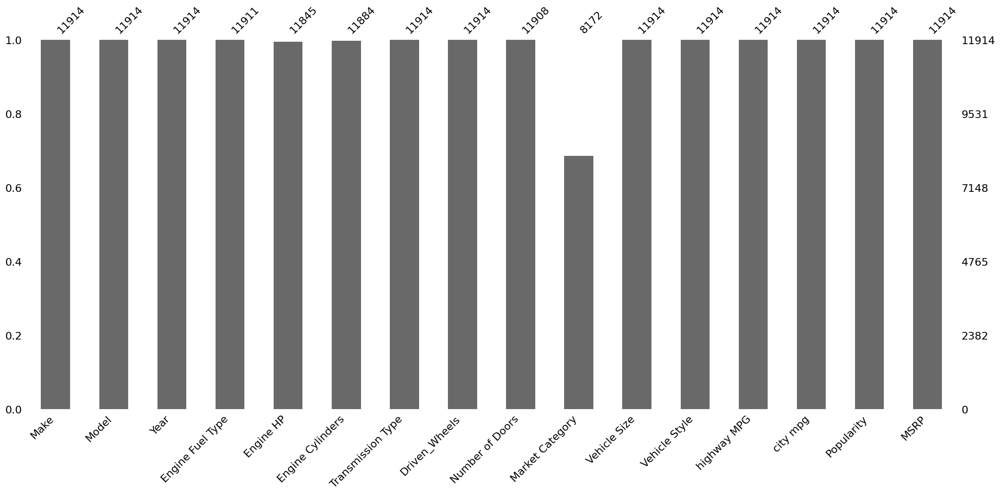

In [ ]:
mano.bar(df)

<Axes: >

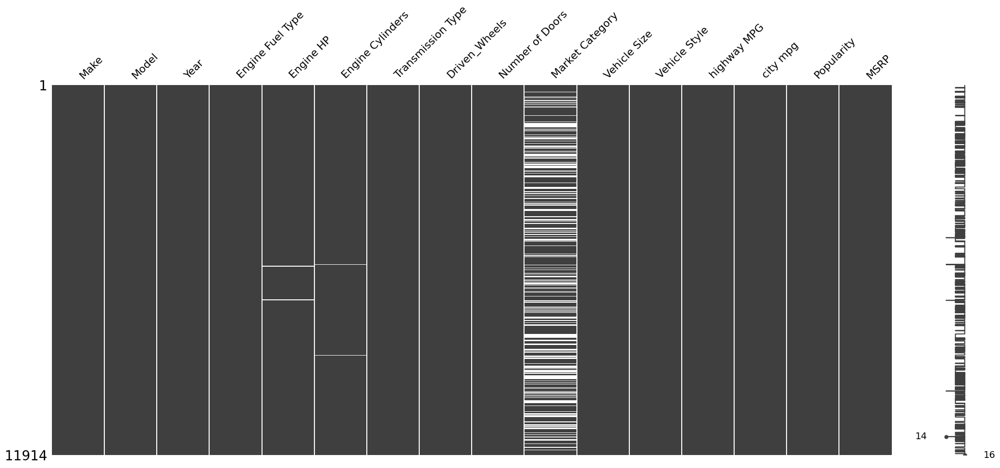

In [ ]:
mano.matrix(df)

<Axes: >

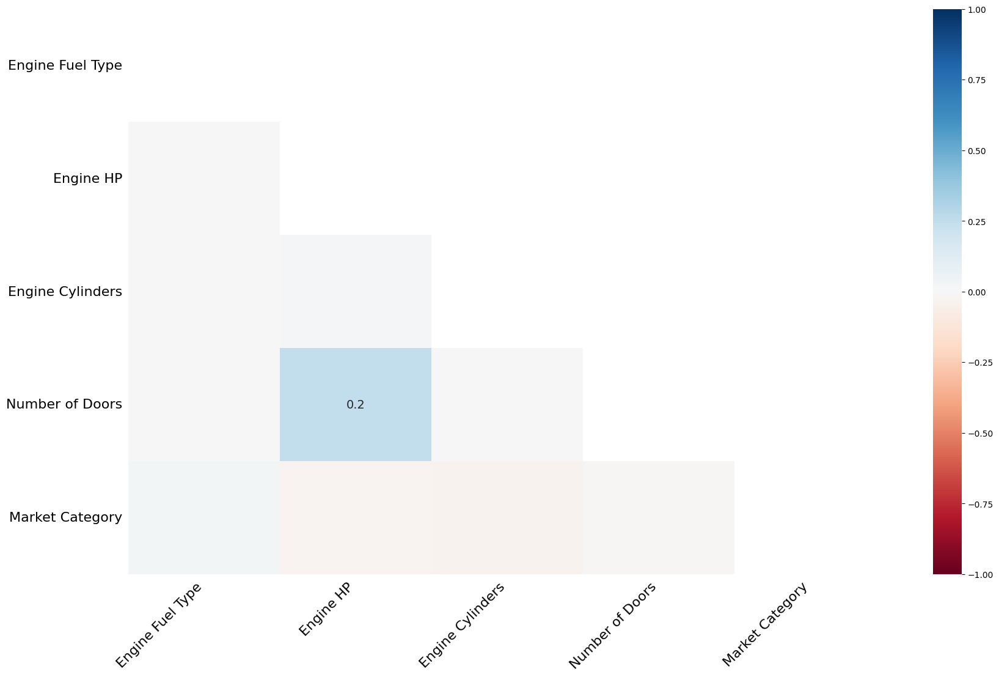

In [ ]:
mano.heatmap(df)

<p>Exploring Market Category column</p>

In [ ]:
df['Market Category'].describe()

count          8172
unique           71
top       Crossover
freq           1110
Name: Market Category, dtype: object

In [ ]:
df['Market Category'].unique()

array(['Factory Tuner,Luxury,High-Performance', 'Luxury,Performance',
       'Luxury,High-Performance', 'Luxury', 'Performance', 'Flex Fuel',
       'Flex Fuel,Performance', nan, 'Hatchback',
       'Hatchback,Luxury,Performance', 'Hatchback,Luxury',
       'Luxury,High-Performance,Hybrid', 'Diesel,Luxury',
       'Hatchback,Performance', 'Hatchback,Factory Tuner,Performance',
       'High-Performance', 'Factory Tuner,High-Performance',
       'Exotic,High-Performance', 'Exotic,Factory Tuner,High-Performance',
       'Factory Tuner,Performance', 'Crossover', 'Exotic,Luxury',
       'Exotic,Luxury,High-Performance', 'Exotic,Luxury,Performance',
       'Factory Tuner,Luxury,Performance', 'Flex Fuel,Luxury',
       'Crossover,Luxury', 'Hatchback,Factory Tuner,Luxury,Performance',
       'Crossover,Hatchback', 'Hybrid', 'Luxury,Performance,Hybrid',
       'Crossover,Luxury,Performance,Hybrid',
       'Crossover,Luxury,Performance',
       'Exotic,Factory Tuner,Luxury,High-Performance',
   

<p>Since Market Category values are MCAR, we can just delete the entire column. Besides, the column contains non-atomic values so it appears unlikely that this column would be useful for future analysis</p>

In [ ]:
df.drop(columns=['Market Category'], inplace=True)
df

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11909,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,46120
11910,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,56670
11911,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,50620
11912,Acura,ZDX,2013,premium unleaded (recommended),300.0,6.0,AUTOMATIC,all wheel drive,4.0,Midsize,4dr Hatchback,23,16,204,50920


</p>Moving towards Engine HP, Engine Cylinders <p>

In [ ]:

from sklearn.impute import KNNImputer

def knn_impute(df, column_names, n_neighbors=5):
    # Select columns for KNN imputation
    df_to_impute = df[column_names]

    # Initialize the KNNImputer with the desired number of neighbors
    imputer = KNNImputer(n_neighbors=n_neighbors)

    # Perform missing value imputation using KNN
    df_imputed = pd.DataFrame(imputer.fit_transform(df_to_impute), columns=column_names)

    # Replace original columns with imputed values
    df[column_names] = df_imputed

    return df


In [ ]:
# Select columns for KNN imputation (Engine HP and Engine Cylinders)
columns_to_impute = ['Engine HP', 'Engine Cylinders']
knn_impute(df,columns_to_impute,n_neighbors=5)


,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11909,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,46120
11910,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,56670
11911,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50620
11912,Acura,ZDX,2013,premium unleaded (recommended),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50920


In [ ]:
df.describe()

,Year,Engine HP,Engine Cylinders,Number of Doors,highway MPG,city mpg,Popularity,MSRP
count,11914.000000,11914.000000,11914.000000,11908.000000,11914.000000,11914.000000,11914.000000,1.191400e+04
mean,2010.384338,249.068204,5.627785,3.436093,26.637485,19.733255,1554.911197,4.059474e+04
std,7.579740,108.989693,1.779232,0.881315,8.863001,8.987798,1441.855347,6.010910e+04
min,1990.000000,55.000000,0.000000,2.000000,12.000000,7.000000,2.000000,2.000000e+03
25%,2007.000000,170.000000,4.000000,2.000000,22.000000,16.000000,549.000000,2.100000e+04
50%,2015.000000,225.000000,6.000000,4.000000,26.000000,18.000000,1385.000000,2.999500e+04
75%,2016.000000,300.000000,6.000000,4.000000,30.000000,22.000000,2009.000000,4.223125e+04
max,2017.000000,1001.000000,16.000000,4.000000,354.000000,137.000000,5657.000000,2.065902e+06


Filling in the missing values using KNN for Engine HP and Engine Cylinders did not change the overall mean and standard deviation proving KNN imputation was an appropriate way to handle missing values.

<p>Moving towards Number of Doors and Engine Fuel Type.Since number of issing values are few, we try to look at them manually</p>

In [ ]:
null_doors_columns = df[df['Number of Doors'].isnull()]
null_doors_columns

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
4666,Ferrari,FF,2013,premium unleaded (required),651.0,12.0,AUTOMATED_MANUAL,all wheel drive,NaN,"Exotic,High-Performance",Large,Coupe,16,11,2774,295000
6930,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,105,102,1391,79500
6931,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,101,98,1391,66000
6932,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,High-Performance",Large,Sedan,105,92,1391,134500
6933,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,rear wheel drive,NaN,"Exotic,Performance",Large,Sedan,100,97,1391,74500
6934,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,107,101,1391,71000


In [ ]:
df['Number of Doors'].unique()

array([ 2.,  4.,  3., nan])

<p>Observe that there are Teslas made in 2016 with missing number of doors. We can look for similar Teslas in data set and fill those values </p>

In [ ]:
filtered_df = df[(df['Make'] == 'Tesla') & (df['Year'] == 2016)  ]
filtered_df


,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
6930,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,105,102,1391,79500
6931,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,101,98,1391,66000
6932,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,High-Performance",Large,Sedan,105,92,1391,134500
6933,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,rear wheel drive,NaN,"Exotic,Performance",Large,Sedan,100,97,1391,74500
6934,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,107,101,1391,71000
6935,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,4.0,"Exotic,Performance",Large,Sedan,102,101,1391,75000
6936,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,4.0,"Exotic,High-Performance",Large,Sedan,107,101,1391,89500
6937,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,4.0,"Exotic,High-Performance",Large,Sedan,100,91,1391,112000
6938,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,rear wheel drive,4.0,"Exotic,Performance",Large,Sedan,90,88,1391,70000


<p>From the above observation we can conclude that Our 5 Teslas with NaN must have 4 doors too.</p>

In [ ]:
df.loc[6930,'Number of Doors'] = 4
df.loc[6931,'Number of Doors'] = 4
df.loc[6932,'Number of Doors'] = 4
df.loc[6933,'Number of Doors'] = 4
df.loc[6934,'Number of Doors'] = 4

filtered_df


,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
6930,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,105,102,1391,79500
6931,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,101,98,1391,66000
6932,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,High-Performance",Large,Sedan,105,92,1391,134500
6933,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,rear wheel drive,NaN,"Exotic,Performance",Large,Sedan,100,97,1391,74500
6934,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,NaN,"Exotic,Performance",Large,Sedan,107,101,1391,71000
6935,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,4.0,"Exotic,Performance",Large,Sedan,102,101,1391,75000
6936,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,4.0,"Exotic,High-Performance",Large,Sedan,107,101,1391,89500
6937,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,all wheel drive,4.0,"Exotic,High-Performance",Large,Sedan,100,91,1391,112000
6938,Tesla,Model S,2016,electric,168.2,0.0,DIRECT_DRIVE,rear wheel drive,4.0,"Exotic,Performance",Large,Sedan,90,88,1391,70000


In [ ]:
filtered_df = df[(df['Make'] == 'Ferrari') & (df['Year'] == 2013)  ]
filtered_df

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
466,Ferrari,458 Italia,2013,premium unleaded (required),562.0,8.0,AUTOMATED_MANUAL,rear wheel drive,2.0,"Exotic,High-Performance",Compact,Convertible,17,13,2774,257412
467,Ferrari,458 Italia,2013,premium unleaded (required),562.0,8.0,AUTOMATED_MANUAL,rear wheel drive,2.0,"Exotic,High-Performance",Compact,Coupe,17,13,2774,233509
2168,Ferrari,California,2013,premium unleaded (required),483.0,8.0,AUTOMATED_MANUAL,rear wheel drive,2.0,"Exotic,High-Performance",Compact,Convertible,19,13,2774,198190
4644,Ferrari,F12 Berlinetta,2013,premium unleaded (required),731.0,12.0,AUTOMATED_MANUAL,rear wheel drive,2.0,"Exotic,High-Performance",Midsize,Coupe,16,11,2774,315888
4666,Ferrari,FF,2013,premium unleaded (required),651.0,12.0,AUTOMATED_MANUAL,all wheel drive,NaN,"Exotic,High-Performance",Large,Coupe,16,11,2774,295000


<p>2 doors in case of Ferrari</p>

In [ ]:
df.loc[4666,'Number of Doors'] = 2
df.loc[4666]

Make                                     Ferrari
Model                                         FF
Year                                        2013
Engine Fuel Type     premium unleaded (required)
Engine HP                                  651.0
Engine Cylinders                            12.0
Transmission Type               AUTOMATED_MANUAL
Driven_Wheels                    all wheel drive
Number of Doors                              2.0
Market Category          Exotic,High-Performance
Vehicle Size                               Large
Vehicle Style                              Coupe
highway MPG                                   16
city mpg                                      11
Popularity                                  2774
MSRP                                      295000
Name: 4666, dtype: object

In [ ]:
null_fuel = df[df['Engine Fuel Type'].isnull()]
null_fuel

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
11321,Suzuki,Verona,2004,NaN,155.0,6.0,AUTOMATIC,front wheel drive,4.0,NaN,Midsize,Sedan,25,17,481,17199
11322,Suzuki,Verona,2004,NaN,155.0,6.0,AUTOMATIC,front wheel drive,4.0,NaN,Midsize,Sedan,25,17,481,20199
11323,Suzuki,Verona,2004,NaN,155.0,6.0,AUTOMATIC,front wheel drive,4.0,NaN,Midsize,Sedan,25,17,481,18499


<p>Aagin, looking for similar values </p>

In [ ]:
filtered_df = df[(df['Make'] == 'Suzuki') & (df['Year'] == 2004)  ]
df.loc[11321]
df.loc[11322]
df.loc[11323]

Make                            Suzuki
Model                           Verona
Year                              2004
Engine Fuel Type                   NaN
Engine HP                        155.0
Engine Cylinders                   6.0
Transmission Type            AUTOMATIC
Driven_Wheels        front wheel drive
Number of Doors                    4.0
Market Category                    NaN
Vehicle Size                   Midsize
Vehicle Style                    Sedan
highway MPG                         25
city mpg                            17
Popularity                         481
MSRP                             18499
Name: 11323, dtype: object

<p> All of them are regular unleaded, so we replace NaNs with those </p>

In [ ]:
df.loc[11321,'Engine Fuel Type'] = 'regular unleaded'
df.loc[11322,'Engine Fuel Type'] = 'regular unleaded'
df.loc[11323,'Engine Fuel Type'] = 'regular unleaded'
df.loc[11321:11323]

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
11321,Suzuki,Verona,2004,regular unleaded,155.0,6.0,AUTOMATIC,front wheel drive,4.0,NaN,Midsize,Sedan,25,17,481,17199
11322,Suzuki,Verona,2004,regular unleaded,155.0,6.0,AUTOMATIC,front wheel drive,4.0,NaN,Midsize,Sedan,25,17,481,20199
11323,Suzuki,Verona,2004,regular unleaded,155.0,6.0,AUTOMATIC,front wheel drive,4.0,NaN,Midsize,Sedan,25,17,481,18499


In [ ]:
df.isnull().sum()

Make                    0
Model                   0
Year                    0
Engine Fuel Type        0
Engine HP               0
Engine Cylinders        0
Transmission Type       0
Driven_Wheels           0
Number of Doors         0
Market Category      3742
Vehicle Size            0
Vehicle Style           0
highway MPG             0
city mpg                0
Popularity              0
MSRP                    0
dtype: int64

<h2>Checking for inconsistent data </h2?

In [ ]:
import pandas as pd

def count_missing_values(df):
    # Replace various non-value placeholders with NaN
    placeholders = ['N/A', 'Not Available', 'NULL', 'Unknown', 'UNKNOWN']
    df.replace(placeholders, np.nan, inplace=True)

    # Count the number of 0s, NaN, and other missing values in each column
    missing_counts = df.apply(lambda x: pd.Series({
        '0s': (x == 0).sum(),
        'NaN': x.isna().sum(),
        'Non-Value Placeholders': (x.isin(placeholders)).sum()
    }))

    # Display the missing value counts in a table
    print("Missing Value Counts:")
    print(missing_counts)

# Example usage
# Assuming df is your DataFrame
# Replace 'df' with your actual DataFrame name if different

# Call the function to count missing values
count_missing_values(df)


Missing Value Counts:
                        Make  Model  Year  Engine Fuel Type  Engine HP  \
0s                         0      0     0                 0          0   
NaN                        0      0     0                 0          0   
Non-Value Placeholders     0      0     0                 0          0   

                        Engine Cylinders  Transmission Type  Driven_Wheels  \
0s                                    56                  0              0   
NaN                                    0                 19              0   
Non-Value Placeholders                 0                  0              0   

                        Number of Doors  Market Category  Vehicle Size  \
0s                                    0                0             0   
NaN                                   0             3742             0   
Non-Value Placeholders                0                0             0   

                        Vehicle Style  highway MPG  city mpg  Popularit

In [ ]:
def print_unique_values_for_object_columns(df):
    """
    Prints unique values and their counts for object-type columns in a DataFrame.

    Args:
        df: The DataFrame to analyze.

    Returns:
        None
    """

    # Select object-type columns
    object_columns = df.select_dtypes(include=['object']).columns

    # Initialize a dictionary to store unique values and their counts
    unique_values_dict = {}

    # Iterate over object-type columns
    for col in object_columns:
        # Extract unique values for the column
        unique_values = df[col].unique()
        unique_values_dict[col] = {'unique_values': unique_values, 'num_unique': len(unique_values)}

    # Print the dictionary in an organized way
    print("Unique Values for Object-Type Columns:")
    for col, values in unique_values_dict.items():
        print(f"- Column: {col}")
        print("  - Unique Values:", values['unique_values'])
        print("  - Number of Unique Values:", values['num_unique'])
        print()

# Example usage

print_unique_values_for_object_columns(df)

Unique Values for Object-Type Columns:
- Column: Make
  - Unique Values: ['BMW' 'Audi' 'FIAT' 'Mercedes-Benz' 'Chrysler' 'Nissan' 'Volvo' 'Mazda'
 'Mitsubishi' 'Ferrari' 'Alfa Romeo' 'Toyota' 'McLaren' 'Maybach'
 'Pontiac' 'Porsche' 'Saab' 'GMC' 'Hyundai' 'Plymouth' 'Honda'
 'Oldsmobile' 'Suzuki' 'Ford' 'Cadillac' 'Kia' 'Bentley' 'Chevrolet'
 'Dodge' 'Lamborghini' 'Lincoln' 'Subaru' 'Volkswagen' 'Spyker' 'Buick'
 'Acura' 'Rolls-Royce' 'Maserati' 'Lexus' 'Aston Martin' 'Land Rover'
 'Lotus' 'Infiniti' 'Scion' 'Genesis' 'HUMMER' 'Tesla' 'Bugatti']
  - Number of Unique Values: 48

- Column: Model
  - Unique Values: ['1 Series M' '1 Series' 100 '124 Spider' '190-Class' '2 Series' 200
 '200SX' '240SX' 240 2 '3 Series Gran Turismo' '3 Series' '300-Class'
 '3000GT' 300 '300M' '300ZX' 323 '350-Class' '350Z' 360 '370Z' 3
 '4 Series Gran Coupe' '4 Series' '400-Class' '420-Class' '456M'
 '458 Italia' '4C' '4Runner' '5 Series Gran Turismo' '5 Series'
 '500-Class' '500e' 500 '500L' '500X' 550 '560-

Converting the values in Model column to string. Some of them are integers.

In [ ]:
df['Model'] = df['Model'].astype(str)

In [ ]:

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

def mice_impute_round(df, column_name):
    # Step 1: Replace 0 values with NaN in the specified column
    df.loc[df[column_name] == 0, column_name] = np.nan

    # Step 2: Apply MICE to impute missing values in the specified column
    mice_imputer = IterativeImputer()
    imputed_values = mice_imputer.fit_transform(df[[column_name]])

    # Round off the imputed values to the nearest integer
    imputed_values_rounded = np.round(imputed_values).astype(int)

    # Update the specified column in the DataFrame with the rounded imputed values
    df[column_name] = imputed_values_rounded

    return df

# Example usage:
# Assuming 'df' is your DataFrame and 'Engine Cylinders' is the column to impute
# Replace 'df' and 'Engine Cylinders' with your actual DataFrame and column name if different
df = mice_impute_round(df, 'Engine Cylinders')



Using MICE for imputing missing values, including cases where the value was originally 0 for engine cylinders, is justified due to its ability to preserve data structure and relationships while providing statistically valid imputations.

In [ ]:
df_transmission_type = df[df['Transmission Type']=='UNKNOWN']
df_transmission_type

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP


Next we handle rows where transmission type is unkown.As observed, we can use other rows with same car features to easily find out transmission type for rows where it is unknown.

In [ ]:
filtered_df = df[(df['Model'] == 'Firebird') & (df['Year'] == 2000) ]
filtered_df

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
4690,Pontiac,Firebird,2000,regular unleaded,200.0,6,MANUAL,rear wheel drive,2.0,"Hatchback,Performance",Midsize,2dr Hatchback,28,17,210,4677
4691,Pontiac,Firebird,2000,regular unleaded,305.0,8,NaN,rear wheel drive,2.0,"Hatchback,Performance",Midsize,2dr Hatchback,23,15,210,6175
4692,Pontiac,Firebird,2000,regular unleaded,305.0,8,NaN,rear wheel drive,2.0,"Hatchback,Factory Tuner,Performance",Midsize,2dr Hatchback,23,15,210,8548
4693,Pontiac,Firebird,2000,regular unleaded,305.0,8,NaN,rear wheel drive,2.0,"Factory Tuner,Performance",Midsize,Convertible,23,15,210,9567
4694,Pontiac,Firebird,2000,regular unleaded,200.0,6,MANUAL,rear wheel drive,2.0,Performance,Midsize,Convertible,28,17,210,5844


All cars with Firebird and year = 2000 have Manual transmission.A quick google search also verified this information.

In [ ]:

# Assuming df is your DataFrame
df.loc[(df['Model'] == 'Firebird') & (df['Year'] == 2000), 'Transmission Type'] = 'MANUAL'


In [ ]:
filtered_df = df[(df['Model'] == 'Achieva') ]
filtered_df

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
1287,Oldsmobile,Achieva,1996,regular unleaded,150.0,4,MANUAL,front wheel drive,4.0,NaN,Midsize,Sedan,30,20,26,2000
1288,Oldsmobile,Achieva,1996,regular unleaded,150.0,4,MANUAL,front wheel drive,2.0,NaN,Midsize,Coupe,30,20,26,2000
1289,Oldsmobile,Achieva,1997,regular unleaded,150.0,4,NaN,front wheel drive,2.0,NaN,Midsize,Coupe,29,19,26,2000
1290,Oldsmobile,Achieva,1997,regular unleaded,150.0,4,NaN,front wheel drive,4.0,NaN,Midsize,Sedan,29,19,26,2000
1291,Oldsmobile,Achieva,1998,regular unleaded,150.0,6,AUTOMATIC,front wheel drive,4.0,NaN,Midsize,Sedan,27,18,26,2000


In [ ]:

# Assuming df is your DataFrame
df.loc[(df['Model'] == 'Achieva') & (df['Year'] == 1997)& (df['Vehicle Style'] == 'Coupe'), 'Transmission Type'] = 'MANUAL'
df.loc[(df['Model'] == 'Achieva') & (df['Year'] == 1997)& (df['Vehicle Style'] == 'Sedan'), 'Transmission Type'] = 'AUTOMATIC'


Manually checked which rows have the most matching features and then transmission type was appropriately selected

In [ ]:
filtered_df = df[(df['Model'] == 'RAM 150') & (df['Year'] == 1991) ]
filtered_df

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
8042,Dodge,RAM 150,1991,regular unleaded,125.0,6,NaN,rear wheel drive,2.0,NaN,Large,Regular Cab Pickup,17,12,1851,2000
8043,Dodge,RAM 150,1991,regular unleaded,125.0,6,NaN,rear wheel drive,2.0,NaN,Large,Regular Cab Pickup,17,12,1851,2000
8044,Dodge,RAM 150,1991,regular unleaded,170.0,8,MANUAL,four wheel drive,2.0,NaN,Large,Extended Cab Pickup,13,10,1851,2000
8045,Dodge,RAM 150,1991,regular unleaded,170.0,8,MANUAL,rear wheel drive,2.0,NaN,Large,Extended Cab Pickup,14,11,1851,2000
8046,Dodge,RAM 150,1991,regular unleaded,125.0,6,NaN,rear wheel drive,2.0,NaN,Large,Regular Cab Pickup,17,12,1851,2000
8047,Dodge,RAM 150,1991,regular unleaded,125.0,6,NaN,rear wheel drive,2.0,NaN,Large,Regular Cab Pickup,17,12,1851,2000
8048,Dodge,RAM 150,1991,regular unleaded,125.0,6,NaN,rear wheel drive,2.0,NaN,Large,Regular Cab Pickup,17,12,1851,2000
8049,Dodge,RAM 150,1991,regular unleaded,125.0,6,NaN,rear wheel drive,2.0,NaN,Large,Regular Cab Pickup,17,12,1851,2000
8050,Dodge,RAM 150,1991,regular unleaded,170.0,8,MANUAL,four wheel drive,2.0,NaN,Large,Extended Cab Pickup,13,10,1851,2000
8051,Dodge,RAM 150,1991,regular unleaded,125.0,6,NaN,rear wheel drive,2.0,NaN,Large,Regular Cab Pickup,17,12,1851,2000


In [ ]:
df.loc[(df['Model'] == 'RAM 150') & (df['Year'] == 1991), 'Transmission Type'] = 'MANUAL'

In [ ]:
filtered_df = df[(df['Model'] == 'Jimmy') & (df['Transmission Type'] == 'UNKNOWN') ]
filtered_df

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP


In [ ]:
df.loc[(df['Model'] == 'Jimmy') & (df['Year'] == 1999)&(df['Driven_Wheels'] == 'rear wheel drive'), 'Transmission Type'] = 'MANUAL'
df.loc[(df['Model'] == 'Jimmy') & (df['Year'] == 1999)&(df['Driven_Wheels'] == 'four wheel drive'), 'Transmission Type'] = 'AUTOMATIC'
df.loc[(df['Model'] == 'Jimmy') & (df['Year'] == 2000), 'Transmission Type'] = 'AUTOMATIC'


Manually checked which rows have the most matching features and then transmission type was appropriately selected

In [ ]:
filtered_df = df[(df['Model'] == 'Le Baron') & (df['Transmission Type'] == 'UNKNOWN') ]
filtered_df

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP


In [ ]:
# Google search/domain knowledge as none of the rows for le baron had their transmission type mentioned
df.loc[(df['Model'] == 'Le Baron'), 'Transmission Type'] = 'AUTOMATIC'

In [ ]:
#making sure no more cars with unknown transmission type exists
df_transmission_type = df[df['Transmission Type']=='UNKNOWN']
df_transmission_type

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP


Moving towards Numerical Columns

In [ ]:
def print_unique_values_for_non_object_columns(df):
    """
    Prints unique values and their counts for non-object-type columns in a DataFrame.

    Args:
        df: The DataFrame to analyze.

    Returns:
        None
    """

    # Select non-object-type columns
    non_object_columns = df.select_dtypes(exclude=['object']).columns

    # Initialize a dictionary to store unique values and their counts
    unique_values_dict = {}

    # Iterate over non-object-type columns
    for col in non_object_columns:
        # Extract unique values for the column
        unique_values = df[col].unique()
        unique_values_dict[col] = {'unique_values': unique_values, 'num_unique': len(unique_values)}

    # Print the dictionary in an organized way
    print("Unique Values for Non-Object-Type Columns:")
    for col, values in unique_values_dict.items():
        print(f"- Column: {col}")
        print("  - Unique Values:", values['unique_values'])
        print("  - Number of Unique Values:", values['num_unique'])
        print()

# Example usage

print_unique_values_for_non_object_columns(df)

Unique Values for Non-Object-Type Columns:
- Column: Year
  - Unique Values: [2011 2012 2013 1992 1993 1994 2017 1991 2016 1990 2015 1996 1997 1998
 2014 1999 2002 2003 2004 1995 2007 2008 2009 2001 2010 2000 2005 2006]
  - Number of Unique Values: 28

- Column: Engine HP
  - Unique Values: [ 335.          300.          230.          320.          172.
  160.          130.          158.          240.          248.
  162.          217.          184.          295.          115.
  140.          155.          114.          100.          241.
  180.          177.          228.          121.          148.
  194.          218.          161.          292.          250.
  255.          222.           82.          134.          306.
  400.          425.          350.          332.          268.
  282.          275.          201.          442.          562.
  597.          237.          270.          445.          443.
  302.          322.          315.          168.2         101.
  135.         

Values arent standardised.Only a few of them have decimal values, so we can round all of them.

In [ ]:
df['Engine HP'] = df['Engine HP'].round()
df['Engine HP'].unique()

array([ 335.,  300.,  230.,  320.,  172.,  160.,  130.,  158.,  240.,
        248.,  162.,  217.,  184.,  295.,  115.,  140.,  155.,  114.,
        100.,  241.,  180.,  177.,  228.,  121.,  148.,  194.,  218.,
        161.,  292.,  250.,  255.,  222.,   82.,  134.,  306.,  400.,
        425.,  350.,  332.,  268.,  282.,  275.,  201.,  442.,  562.,
        597.,  237.,  270.,  445.,  443.,  302.,  322.,  315.,  168.,
        101.,  135.,  485.,  238.,  515.,  543.,  631.,  604.,  620.,
        611.,  661.,  157.,  402.,  389.,  110.,  532.,  170.,  165.,
        125.,  641.,  535.,  153.,  144.,  188.,  372.,  108.,  190.,
        205.,  200.,  227.,  173.,  220.,  210.,  280.,  207.,  265.,
        260.,  290.,  285.,  390.,  225.,  185.,  150.,  430.,  520.,
        560.,  475.,  500.,  540.,  370.,  580.,  420.,  345.,  195.,
        193.,  208.,  181.,  236.,  186.,  252.,  310.,  333.,  340.,
        450.,  281.,  288.,  138.,  137.,  106.,  271.,  196.,  212.,
        278.,  189.,

<p> Looking for and deleting duplicate rows:</p>

In [ ]:
# Find duplicate rows in a dataframe:

duplicate_rows = df[df.duplicated()]

# Print the duplicate rows:
duplicate_rows

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
14,BMW,1 Series,2013,premium unleaded (required),230.0,6,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,19,3916,31500
18,Audi,100,1992,regular unleaded,172.0,6,MANUAL,front wheel drive,4.0,Luxury,Midsize,Sedan,24,17,3105,2000
20,Audi,100,1992,regular unleaded,172.0,6,MANUAL,front wheel drive,4.0,Luxury,Midsize,Sedan,24,17,3105,2000
24,Audi,100,1993,regular unleaded,172.0,6,MANUAL,front wheel drive,4.0,Luxury,Midsize,Sedan,24,17,3105,2000
25,Audi,100,1993,regular unleaded,172.0,6,MANUAL,front wheel drive,4.0,Luxury,Midsize,Sedan,24,17,3105,2000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11481,Suzuki,X-90,1998,regular unleaded,95.0,4,MANUAL,four wheel drive,2.0,NaN,Compact,2dr SUV,26,22,481,2000
11603,Volvo,XC60,2017,regular unleaded,302.0,4,AUTOMATIC,all wheel drive,4.0,"Crossover,Luxury,Performance",Midsize,4dr SUV,29,20,870,46350
11604,Volvo,XC60,2017,regular unleaded,240.0,4,AUTOMATIC,front wheel drive,4.0,"Crossover,Luxury",Midsize,4dr SUV,30,23,870,40950
11708,Suzuki,XL7,2008,regular unleaded,252.0,6,AUTOMATIC,all wheel drive,4.0,Crossover,Midsize,4dr SUV,22,15,481,29149


In [ ]:
# Remove duplicate rows and keep only one:

df.drop_duplicates(inplace=True)
duplicate_rows = df[df.duplicated()]
duplicate_rows

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP


<h2>Univariate Analysis</h2>

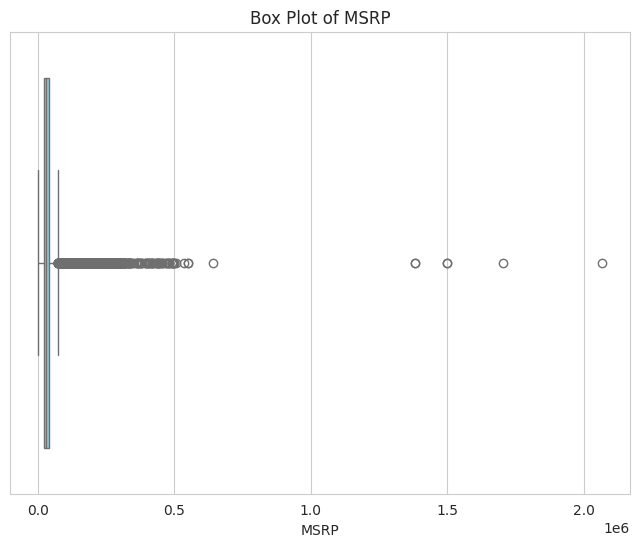

In [ ]:
# Set the style of the plot
sns.set_style('whitegrid')

# Create a box plot for the "MSRP" column
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['MSRP'], color='skyblue')
plt.title('Box Plot of MSRP')
plt.xlabel('MSRP')
plt.show()

There are outliers in MSRP. So some cars are pretty expensive!

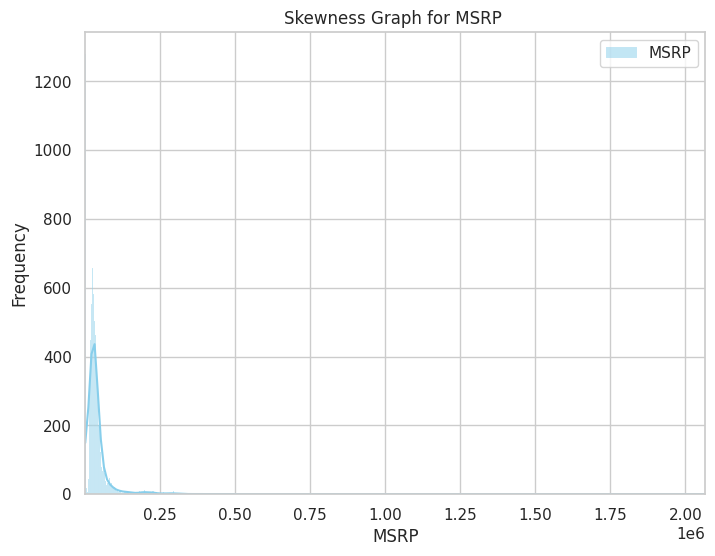

In [ ]:
sns.set(style="whitegrid")

# Plotting the skewness graph
plt.figure(figsize=(8, 6))
sns.histplot(df['MSRP'], kde=True, color='skyblue', label='MSRP')
plt.title('Skewness Graph for MSRP ')
plt.xlabel('MSRP')
plt.ylabel('Frequency')
plt.legend()
plt.xlim(df['MSRP'].min(), df['MSRP'].max())  # Set x-axis limits based on data range
plt.ylim(0, None)  # Set y-axis lower limit to 0 and upper limit to auto
plt.show()

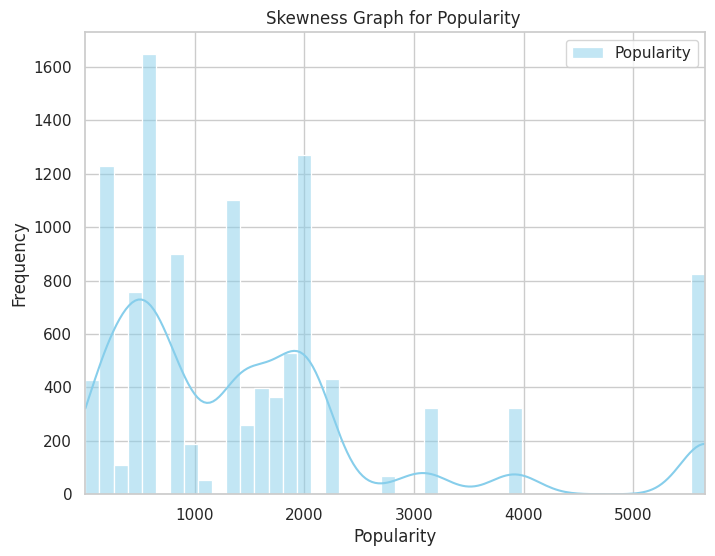

In [ ]:
sns.set(style="whitegrid")

# Plotting the skewness graph
plt.figure(figsize=(8, 6))
sns.histplot(df['Popularity'], kde=True, color='skyblue', label='Popularity')
plt.title('Skewness Graph for Popularity ')
plt.xlabel('Popularity')
plt.ylabel('Frequency')
plt.legend()
plt.xlim(df['Popularity'].min(), df['Popularity'].max())  # Set x-axis limits based on data range
plt.ylim(0, None)  # Set y-axis lower limit to 0 and upper limit to auto
plt.show()

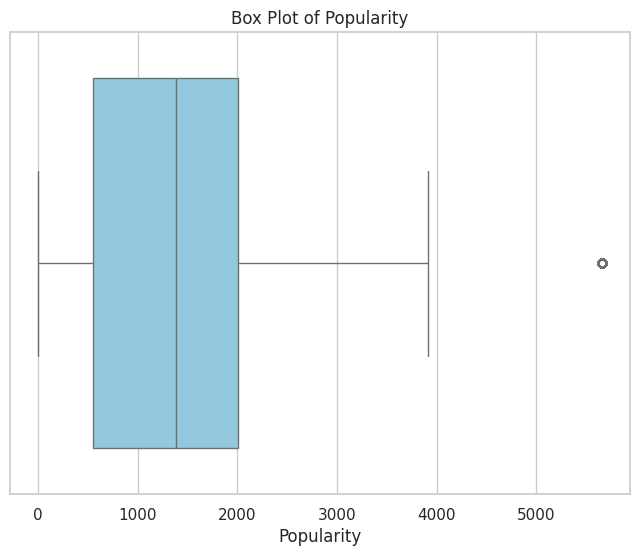

In [ ]:
# Set the style of the plot
sns.set_style('whitegrid')

# Create a box plot for the "MSRP" column
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['Popularity'], color='skyblue')
plt.title('Box Plot of Popularity')
plt.xlabel('Popularity')
plt.show()

There is an outlier in Popularity indicating that one car is very popular

In [ ]:
df['Popularity'].describe()

count    11199.000000
mean      1558.483347
std       1445.668872
min          2.000000
25%        549.000000
50%       1385.000000
75%       2009.000000
max       5657.000000
Name: Popularity, dtype: float64

In [ ]:
df_popular = df[df['Popularity'] > 5000]

models = ', '.join(df_popular['Model'].unique())
makes = ', '.join(df_popular['Make'].unique())

print(f'Models with popularity above 5000: {models}')
print(f'Makes with popularity above 5000: {makes}')

Models with popularity above 5000: Aerostar, Aspire, Bronco II, Bronco, C-Max Hybrid, Contour SVT, Contour, Crown Victoria, E-150, E-250, E-Series Van, E-Series Wagon, Edge, Escape Hybrid, Escape, Escort, Expedition, Explorer Sport Trac, Explorer Sport, Explorer, F-150 Heritage, F-150 SVT Lightning, F-150, F-250, Festiva, Fiesta, Five Hundred, Flex, Focus RS, Focus ST, Focus, Freestar, Freestyle, Fusion Hybrid, Fusion, GT, LTD Crown Victoria, Mustang SVT Cobra, Mustang, Probe, Ranger, Shelby GT350, Shelby GT500, Taurus X, Taurus, Tempo, Thunderbird, Transit Connect, Transit Wagon, Windstar Cargo, Windstar
Makes with popularity above 5000: Ford


<p>We can determine from the above output that Fords are very popular </p>

<p>Histograms for all the categorical columns</p>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random

def plot_multiple_histograms(columns, df, graphs_per_row,fontsize,rotation):
    # Calculate the number of rows needed
    num_rows = (len(columns) + graphs_per_row - 1) // graphs_per_row

    # Set the style of the plots
    sns.set_style('whitegrid')

    # Create subplots for each histogram
    fig, axs = plt.subplots(num_rows, graphs_per_row, figsize=(120, 2*len(columns)*num_rows))

    for i, col in enumerate(columns):
        color = sns.color_palette()[random.randint(0, len(sns.color_palette()) - 1)]
        row_idx = i // graphs_per_row
        col_idx = i % graphs_per_row


        # Plot histogram for the current column

        sns.histplot(df[col], ax=axs[row_idx, col_idx], kde=True, color=color)

        axs[row_idx, col_idx].set_title(f'Histogram of {col}', fontsize=45)
        axs[row_idx, col_idx].tick_params(axis='both', which='major', labelsize=fontsize)
        axs[row_idx, col_idx].tick_params(axis='x', rotation=rotation)
        axs[row_idx, col_idx].set_xlabel(col, fontsize=35)
        axs[row_idx, col_idx].set_ylabel('Count', fontsize=35)

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming df is your DataFrame containing the car features data
# Replace 'df' with your actual DataFrame name if different
# df = pd.DataFrame()  # Replace with your DataFrame
columns = ['Engine HP', 'Engine Cylinders', 'highway MPG', 'city mpg', 'Popularity', 'MSRP',
           'Transmission Type', 'Vehicle Style', 'Vehicle Size','Number of Doors','Engine Fuel Type','Driven_Wheels','Year','Model','Make']

# Define the number of graphs per row
graphs_per_row = 2
labels_size=40
labels_rotation=45

plot_multiple_histograms(columns, df, graphs_per_row,labels_size,labels_rotation)


These histograms provide us more insight into the type of cars and their distribution in our dataset.For example,in this dataset, cars with automatic transmission,regular unleaded fuel type and sedans and SUVs are most common.

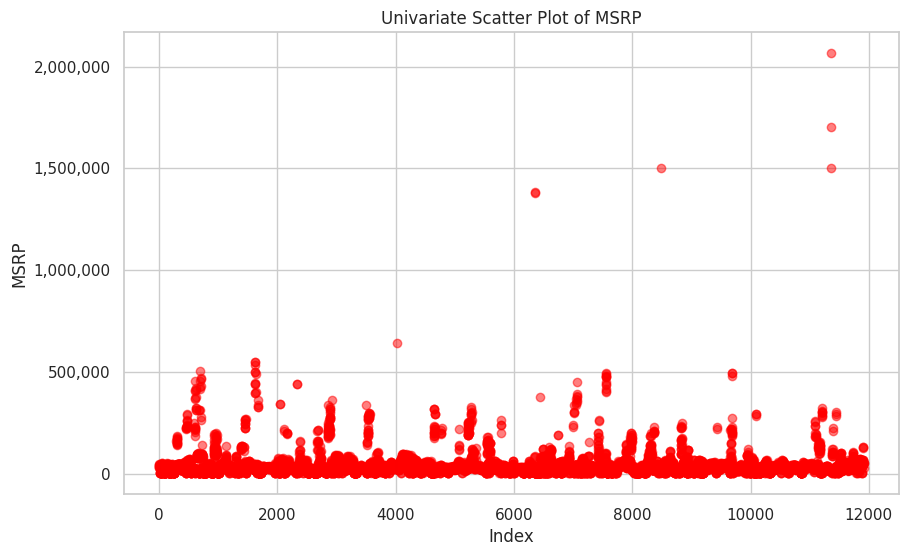

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import ticker

# Assuming df is your DataFrame containing the car features data
# Replace 'df' with your actual DataFrame name if different

# Create a scatter plot for the "MSRP" column against its index
plt.figure(figsize=(10, 6))
plt.scatter(df.index, df['MSRP'], color='red', marker='o', alpha=0.5)
plt.title('Univariate Scatter Plot of MSRP')
plt.xlabel('Index')
plt.ylabel('MSRP')

# Set the y-axis tick formatter to display entire numbers
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: '{:,.0f}'.format(x)))

plt.grid(True)
plt.show()


Majority of cars are clustered at the lower end with the presence of some outliers (indicating luxury vehicles)

<h1>Bivariate Analysis</h1>


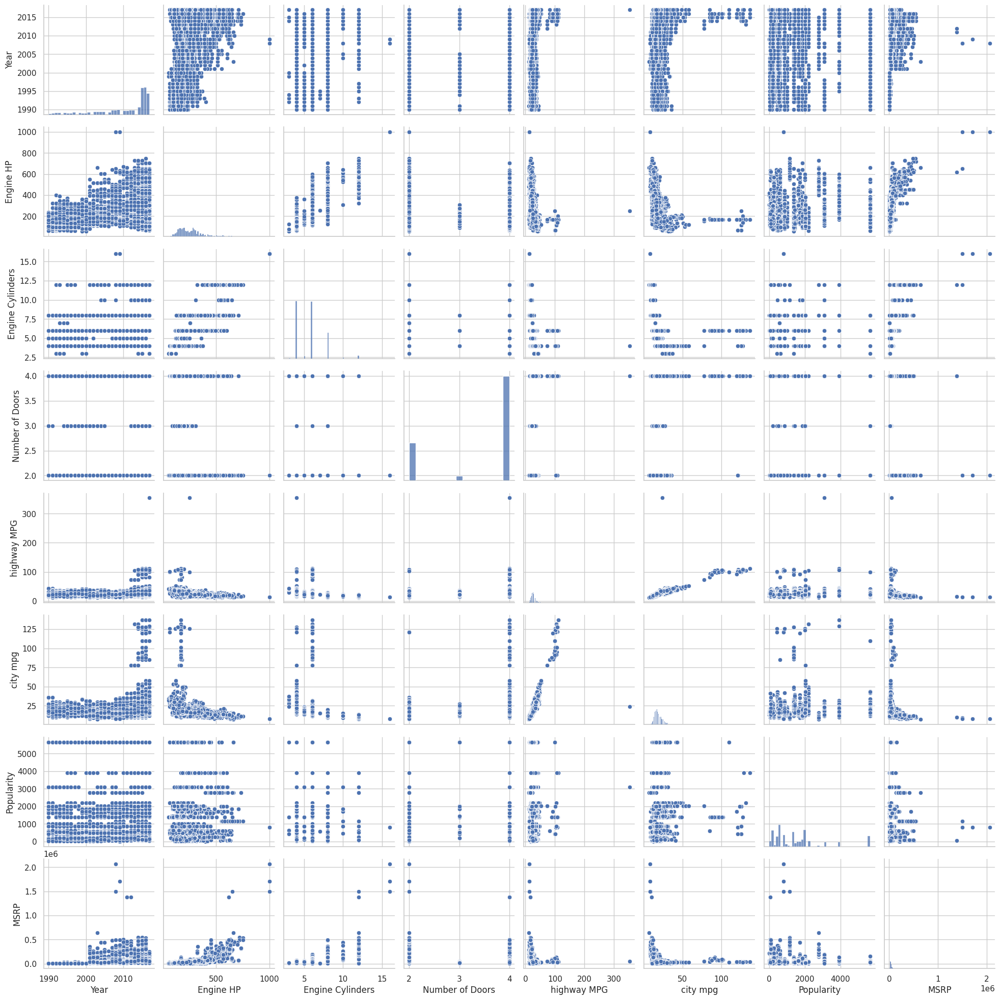

In [ ]:
sns.pairplot(df)

<ipython-input-51-d9b4d4b63651>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True)


<Axes: >

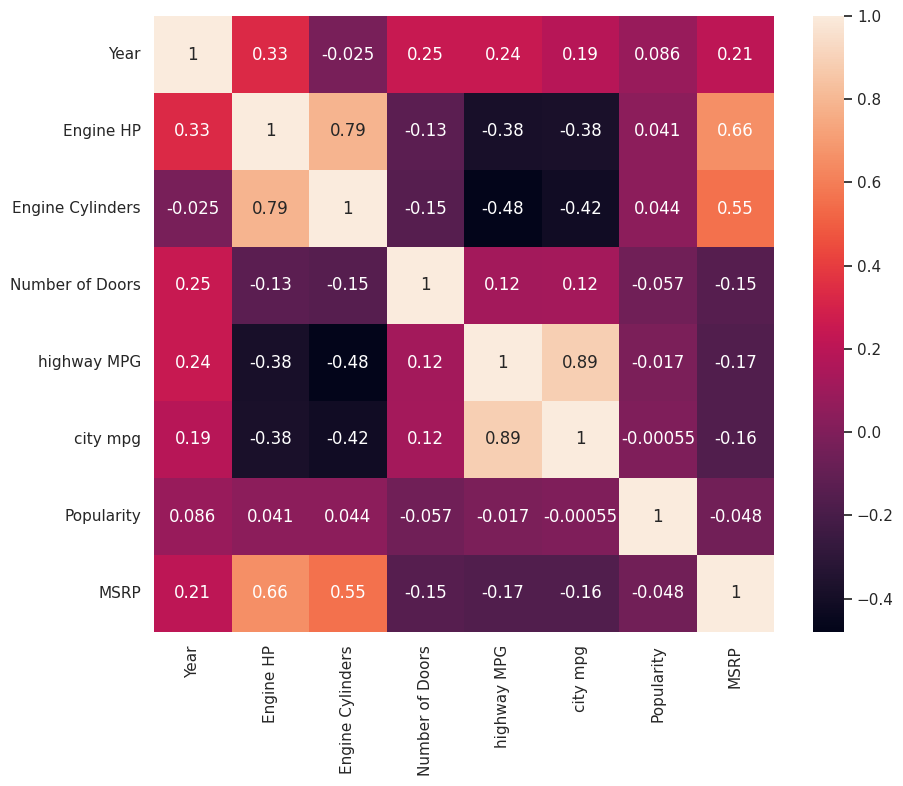

In [ ]:
# Set the size of the heatmap figure
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True)

Highest negative correlation is between Engine HP and highway MPG.This means as Engine HP increases, highway MPG tends to decrease. Highest positive correlation is between engine cylinder and engine HP.As engine cylinders increase,engine HP increases significantly too.Through this we also know which numerical features have most impact and what type of correlation they have with MSRP and Popularity. (Both these columns are our focus columns)

<h3>Statistical Tests</h3>

In [ ]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.stats import chi2_contingency
from scipy.stats import chi2

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd

def anova_and_tukey(df, target_col, other_cols):
    for col in other_cols:
        # Perform ANOVA test
        f_stat, p_val = f_oneway(*[group for name, group in df.groupby(col)[target_col]])
        print(f"ANOVA Test for {target_col} vs {col}: F-statistic = {f_stat:.4f}, p-value = {p_val:.2e}")

        # Perform Tukey HSD test if p-value is less than 0.05
        if p_val < 0.05:
            print(f"Since p value is less than 0.05 in the ANOVA Test, we reject the null hypothesis H0 and conclude that there are significant differences in the mean {target_col} across different {col} types.")
            tukey_result = pairwise_tukeyhsd(df[target_col], df[col])
           # print(tukey_result)
        else:
            print(f"Since p value is more than 0.05 in the ANOVA Test, we fail to reject the null hypothesis H0 and conclude that there are NO significant differences in the mean {target_col} across different {col} types.")
        print("-" * 50)

# Example usage
# Assuming df is your DataFrame and other_cols is an array of other columns to test against





In [56]:
# Define target column and other columns array
target_column = 'MSRP'
other_columns = ['Make', 'Model', 'Year', 'Engine Fuel Type', 'Engine HP',
       'Engine Cylinders', 'Transmission Type', 'Driven_Wheels',
       'Number of Doors', 'Vehicle Size', 'Vehicle Style', 'highway MPG',
       'city mpg', 'Popularity',
       ]

# Call the function
anova_and_tukey(df, target_column, other_columns)

ANOVA Test for MSRP vs Make: F-statistic = 739.6748, p-value = 0.00e+00
Since p value is less than 0.05 in the ANOVA Test, we reject the null hypothesis H0 and conclude that there are significant differences in the mean MSRP across different Make types.


KeyboardInterrupt: 

In [57]:
from scipy.stats import chi2_contingency
#use this function for chi square test amongst some columns
def chi_square_test(df, target_col, other_cols):
    for col in other_cols:
        # Create a contingency table
        contingency_table = pd.crosstab(df[col], df[target_col])

        # Perform Chi-square test
        chi2_stat, p_val, dof, _ = chi2_contingency(contingency_table)
        print(f"Chi-square Test for {target_col} vs {col}:")
        print(f"Contingency Table:")
        print(contingency_table)
        print(f"Degrees of Freedom: {dof}")
        print(f"Chi2-statistic = {chi2_stat:.4f}, p-value = {p_val:.2e}")

        # Interpret the results based on the p-value threshold
        if p_val < 0.05:
            print(f"Since p value is less than 0.05 in the Chi-square Test, we reject the null hypothesis H0 and conclude that there is an association between {target_col} and {col}.")
        else:
            print(f"Since p value is more than 0.05 in the Chi-square Test, we fail to reject the null hypothesis H0 and conclude that there is NO association between {target_col} and {col}.")
        print("-" * 50)



In [ ]:
# Example usage

# Define target column and other columns array
target_column = 'highway MPG'
other_columns = ['Engine Cylinders', 'Transmission Type', 'Driven_Wheels',
       'Number of Doors']

# Call the function
chi_square_test(df, target_column, other_columns)

In [61]:
from scipy.stats import chi2_contingency
#use this function for chi square test amongst all input columns
# Function for chi-square test among all input columns
def chi_square_test(df, cols):
    for i, col1 in enumerate(cols):
        for col2 in cols[i+1:]:
            # Create a contingency table
            contingency_table = pd.crosstab(df[col1], df[col2])

            # Perform the chi-square test
            chi2, p, dof, expected = chi2_contingency(contingency_table)

            # Print the results
            print(f"Chi-square test between {col1} and {col2}:")
            print(f"Degrees of Freedom: {dof}")
            print("Contingency Table:")
            print(contingency_table)
            print(f"Chi-square statistic: {chi2:.4f}")
            if p < 0.05:
                print(f"Since p value is less than 0.05 in the Chi-square Test, we reject the null hypothesis H0 and conclude that there is an association between {col1} and {col2}.")
            else:
                print(f"Since p value is greater than or equal to 0.05 in the Chi-square Test, we fail to reject the null hypothesis H0 and conclude that there is no association between {col1} and {col2}.")
            print("-" * 50)

# Example usage
cols = ['Make', 'Model', 'Year', 'Engine Fuel Type', 'Engine HP',
        'Engine Cylinders', 'Transmission Type', 'Driven_Wheels',
        'Number of Doors', 'Vehicle Size', 'Vehicle Style', 'highway MPG',
        'city mpg', 'Popularity']

chi_square_test(df, cols)


Chi-square test between Make and Model:
Degrees of Freedom: 42958
Contingency Table:
Model          1 Series  1 Series M  100  124 Spider  190-Class   2  2 Series  \
Make                                                                            
Acura                 0           0    0           0          0   0         0   
Alfa Romeo            0           0    0           0          0   0         0   
Aston Martin          0           0    0           0          0   0         0   
Audi                  0           0   11           0          0   0         0   
BMW                  15           1    0           0          0   0        17   
Bentley               0           0    0           0          0   0         0   
Bugatti               0           0    0           0          0   0         0   
Buick                 0           0    0           0          0   0         0   
Cadillac              0           0    0           0          0   0         0   
Chevrolet             0 

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


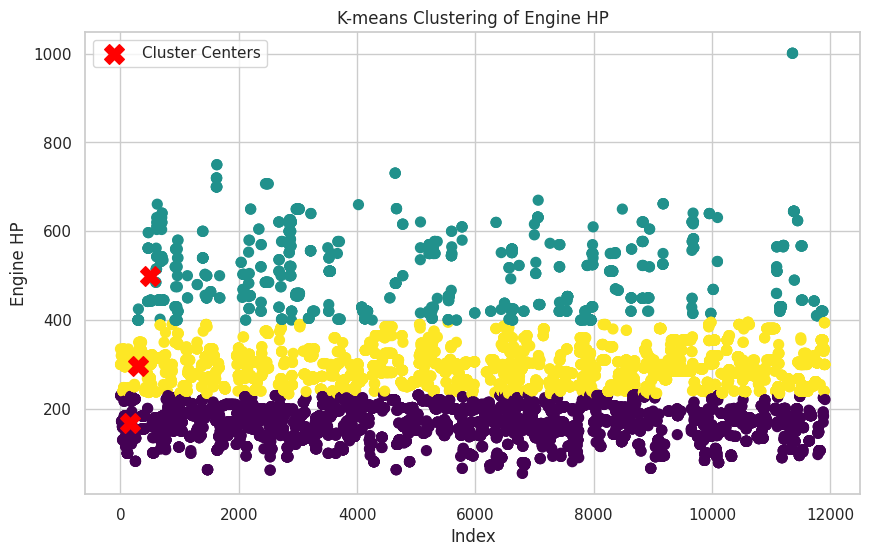

Cluster Analysis for Engine HP:
Cluster 1: Mean Engine HP = 168.73
Cluster 2: Mean Engine HP = 498.43
Cluster 3: Mean Engine HP = 296.63
--------------------------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


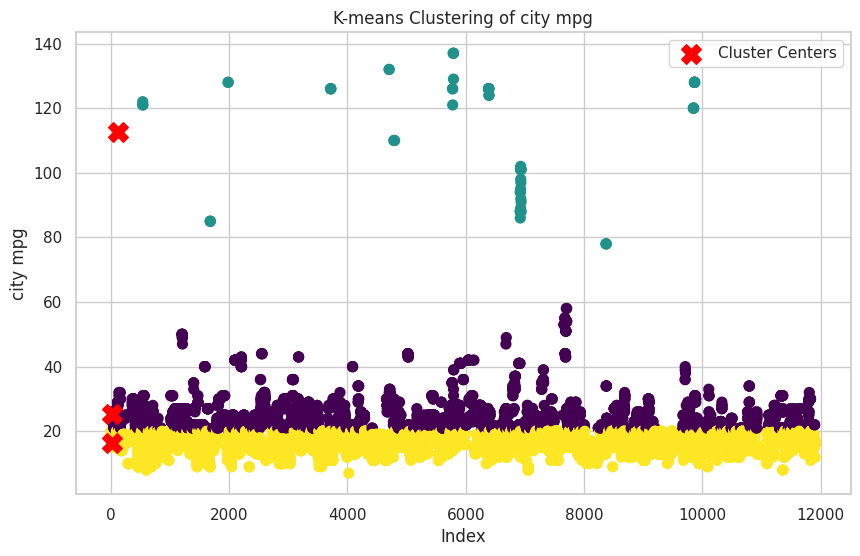

Cluster Analysis for city mpg:
Cluster 1: Mean city mpg = 25.39
Cluster 2: Mean city mpg = 112.70
Cluster 3: Mean city mpg = 16.23
--------------------------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


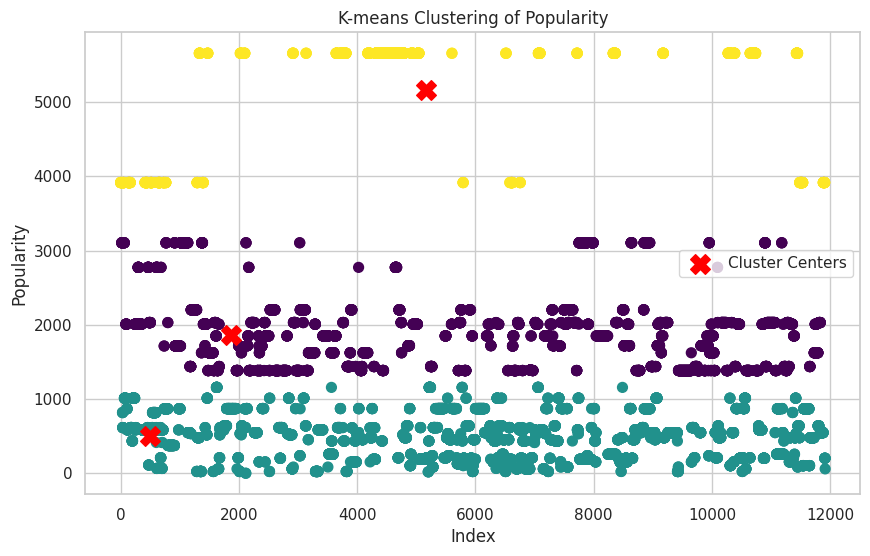

Cluster Analysis for Popularity:
Cluster 1: Mean Popularity = 1867.16
Cluster 2: Mean Popularity = 501.55
Cluster 3: Mean Popularity = 5166.07
--------------------------------------------------


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


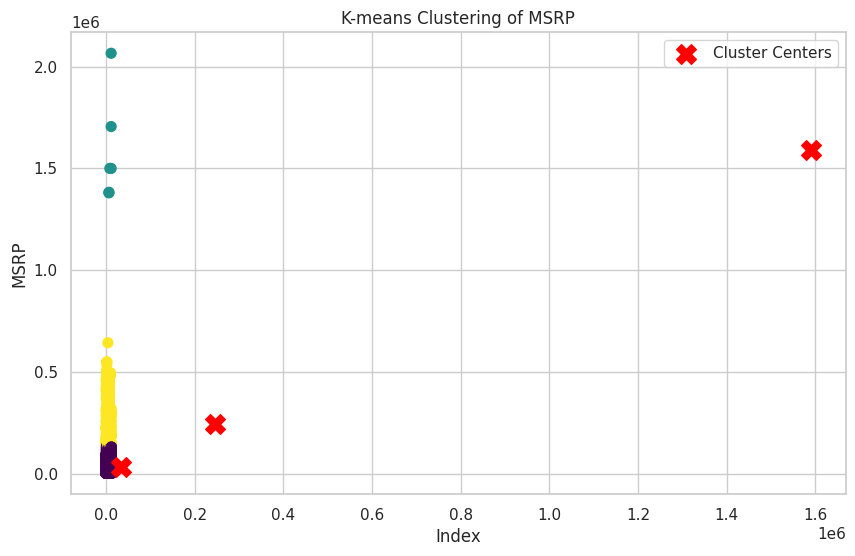

Cluster Analysis for MSRP:
Cluster 1: Mean MSRP = 32800.33
Cluster 2: Mean MSRP = 1589070.17
Cluster 3: Mean MSRP = 245781.85
--------------------------------------------------


In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def perform_cluster_analysis(df, column_names, num_clusters):
    for col, n_clusters in zip(column_names, num_clusters):
        # Extract the column data for clustering
        column_data = df[col].values.reshape(-1, 1)

        # Perform K-means clustering
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans.fit(column_data)

        # Get the cluster centers and labels
        cluster_centers = kmeans.cluster_centers_
        cluster_labels = kmeans.labels_

        # Add cluster labels to the DataFrame
        df[f'{col} Cluster'] = cluster_labels

        # Visualize the clusters
        plt.figure(figsize=(10, 6))
        plt.scatter(df.index, df[col], c=cluster_labels, cmap='viridis', s=50)
        plt.scatter(cluster_centers, cluster_centers, c='red', marker='X', s=200, label='Cluster Centers')
        plt.title(f'K-means Clustering of {col}')
        plt.xlabel('Index')
        plt.ylabel(col)
        plt.legend()
        plt.grid(True)
        plt.show()

        # Interpretation of cluster analysis
        print(f"Cluster Analysis for {col}:")
        for cluster_num in range(n_clusters):
            cluster_data = df[df[f'{col} Cluster'] == cluster_num][col]
            cluster_mean = cluster_data.mean()
            print(f"Cluster {cluster_num + 1}: Mean {col} = {cluster_mean:.2f}")
        print("-" * 50)

# Example usage
# Assuming df is your DataFrame and column_names is a list of column names to analyze
# num_clusters is a list specifying the number of clusters for each feature in column_names
# Replace 'df', 'column_names', and 'num_clusters' with your actual data if different

# Define the list of column names for cluster analysis
columns_to_cluster = ['Engine HP','city mpg', 'Popularity', 'MSRP']
num_clusters_list = [3, 3, 3,3]  # Number of clusters for each feature in columns_to_cluster

#cluster analysis is done on copy of orignal dataframe as it introduces new cluster columns

df1 = df.copy()
# Call the function to perform cluster analysis
perform_cluster_analysis(df1, columns_to_cluster, num_clusters_list)


Cluster Analysis for the following columns help us group rows according to our convenience,for:
Engine HP: Clustering based on engine horsepower can help identify groups of cars with similar performance levels.
City mpg: Clustering based on fuel efficiency can group cars into categories such as fuel-efficientand fuel-consuming.From our results,we can conclude that cluster 1 indicates fuel-efficient cars, cluster 2 indicates fuel-consuming and cluster 3 are attributed to more luxury cars, this is why they are less in number and have very high city mpg.
Popularity: Clustering based on the popularity of cars can identify trends related to customer preferences and market demand.Here,cluster 2 represents cars with least popularity,they may include niche or less well-known models or brands that cater to specific customer segments.Cluster 1 represents cars with moderate popularity. Cluster 3 represents cars with highest popularity.They may include popular models from well-known brands or vehicles with unique features that resonate well with consumers.
MSRP: Clustering based on the manufacturer's suggested retail price can group cars into price categories, such as budget(cluster 1), mid-range(cluster 3), and luxury (cluster 2).

In [63]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

def regression_analysis(df, target_column):
   # Select only numerical columns (int and float)
    numerical_cols = df.select_dtypes(include=['int', 'float']).columns.tolist()

    # Remove the target column from numerical_cols if it's in the list
    if target_column in numerical_cols:
        numerical_cols.remove(target_column)

    # Separate features (independent variables) and target variable
    X = df[numerical_cols]
    y = df[target_column]


    # Initialize and fit the linear regression model
    model = LinearRegression()
    model.fit(X, y)

    # Make predictions
    y_pred = model.predict(X)

    # Calculate metrics
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)


    # Print regression results
    print(f"Regression Analysis for '{target_column}' (Numerical Columns Only):")
    print("Coefficients:")
    for col, coef in zip(numerical_cols, model.coef_):
        print(f"{col}: {coef}")
    print("Intercept:", model.intercept_)
    print("Mean Squared Error (MSE):", mse)
    print("R-squared (R2):", r2)

    # Plot actual vs. predicted values
    plt.figure(figsize=(8, 6))
    plt.scatter(y, y_pred)
    plt.plot([min(y), max(y)], [min(y), max(y)], linestyle='--', color='red')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title('Actual vs. Predicted Values')
    plt.grid(True)
    plt.show()





Regression Analysis for 'Popularity' (Numerical Columns Only):
Coefficients:
Year: 34.292446242359155
Engine HP: -0.6732415959111174
Engine Cylinders: 119.30844029411816
Number of Doors: -175.25666710113563
highway MPG: -14.172120899341763
city mpg: 11.74025170862045
MSRP: -0.0034937621274856445
Intercept: -67005.6078019041
Mean Squared Error (MSE): 2019332.772341737
R-squared (R2): 0.03370659533711429


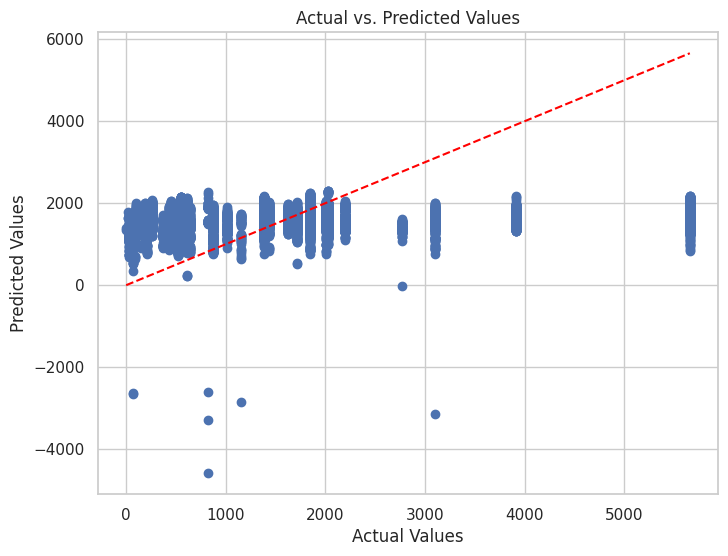

In [64]:
# Example usage:
# Assuming 'df' is your DataFrame and 'Popularity' is the target column
# Replace 'df' and 'Popularity' with your actual DataFrame and target column name if different
regression_analysis(df, 'Popularity')

The low R-squared value of 3.37% suggests that the included independent variables explain only a small portion of the variability in Popularity. It may be that the categorical features have a larger impact on popularity but that cannot be calculated using regression. Important deductions are that each additional Engine Cylinder is associated with an increase of approximately 118.71 units in Popularity (holding other variables constant) but surprisngly,an increase in Engine HP is associated with a decrease of approximately 0.67 units in Popularity (holding other variables constant).

Regression Analysis for 'MSRP' (Numerical Columns Only):
Coefficients:
Year: 150.87360669582694
Engine HP: 319.1541991565377
Engine Cylinders: 5681.152141124051
Number of Doors: -5073.483735875775
highway MPG: 629.163163915523
city mpg: 300.9920171966853
Popularity: -3.5367159428191144
Intercept: -374190.1783523396
Mean Squared Error (MSE): 2044159318.582017
R-squared (R2): 0.4601060787834407


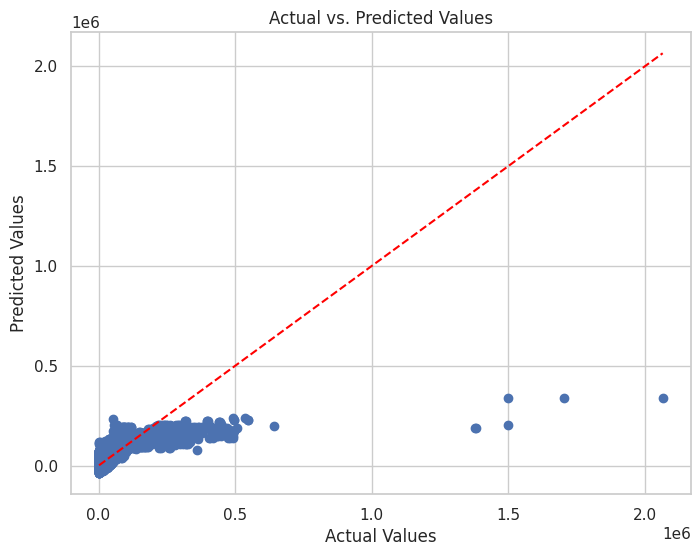

In [65]:
# Example usage:
# Assuming 'df' is your DataFrame and 'Popularity' is the target column
# Replace 'df' and 'Popularity' with your actual DataFrame and target column name if different
regression_analysis(df, 'MSRP')

The R-squared value indicates that the included independent variables collectively explain approximately 46.01% of the variability in MSRP. This suggests that the model has moderate predictive power for MSRP.Important deductions are that higher Highway MPG and City MPG are associated with increases in MSRP, although the impact of City MPG is smaller compared to Highway MPG.In addition,each additional Engine Cylinder is associated with a substantial increase of approximately $5686.14 in MSRP, holding other variables constant and each additional year is associated with an increase of approximately $151.35 in MSRP, holding other variables constant.

In [66]:
# Assuming df is your DataFrame and file_path is the desired file path to save the Excel file
file_path = '/content/clean_car_features.xlsx'
df.to_excel(file_path, index=False)
print(f"DataFrame has been successfully exported to {file_path}")


DataFrame has been successfully exported to /content/clean_car_features.xlsx
